In [2]:
%reload_ext autoreload
%autoreload 2

In [3]:
from load_loyalty_v4_data import load_loyalty_df, to_trajectory, SEGMENT_OLD, SEGMENT_NEW
import numpy as np

# Отбор признаков живёт здесь, а не в загрузчике: он читает
# loyalty_v4_all_cols.parquet и отдаёт все 104 признака, без порога.
# Анонимизированная копия для тезиса: имена признаков x0..x103, маппинг на
# исходные имена и на сегменты — в client-system/thesis_feature_mapping.json.
MIN_MAX_SHARE = 0.03
DROP_FEATURES = ['x50', 'x5', 'x62']

df_both, all_features = load_loyalty_df(segment=None)

feature_cols = [
    c for c in all_features
    if c not in DROP_FEATURES and df_both[c].max() >= MIN_MAX_SHARE
]

df_old = df_both[(df_both['segment'] == SEGMENT_OLD)]
df_new = df_both[(df_both['segment'] == SEGMENT_NEW)]

X_old, train_old, group_ids_old = to_trajectory(df_old, feature_cols)
X_new, train_new, group_ids_new = to_trajectory(df_new, feature_cols)
assert group_ids_old == group_ids_new
group_ids = group_ids_old

dates = np.sort(df_old['dt'].unique())
assert np.array_equal(dates, np.sort(df_new['dt'].unique()))

print(f"признаков:  {len(all_features)} -> {len(feature_cols)}")
print(f"сегмент old {SEGMENT_OLD}: группы {group_ids}, train {train_old.shape}")
print(f"сегмент new {SEGMENT_NEW}: группы {group_ids}, train {train_new.shape}")
print(f"даты:       {dates[0]} .. {dates[-1]}  ({len(dates)} дат)")



признаков:  104 -> 86
сегмент old 0: группы [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5)], train (5, 731, 86)
сегмент new 1: группы [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5)], train (5, 731, 86)
даты:       2024-01-01 .. 2025-12-31  (731 дат)


## Предсказания лучшей модели для segment 0

`segment 0` здесь — первая из пяти обучающих траекторий прогона (`group_id`
внутри одного сегмента витрины, не путать со столбцом `segment` из ячейки
выше), т.е. `traj=0` в терминах `runResults_loyaltyV4_run1_*.pickle`.

Лучшая итерация культинга выбирается автоматически скалярным баллом из
`iterationScore.py` (`selectBestIteration_fn`) — то же правило, что
`plotSelectedIterationsLoyalty.ipynb` применяет по умолчанию
(`iterationNumbersToPlot = 'auto'`): плато лучшего балла, внутри него —
самая разреженная модель.

Коэффициенты берутся из `historyCoeffArrayAll` как есть, без refit: прогон
был с `enforceBoundednessFlag=True, boundednessMethod='trapping'`, так что
именно эти (не переобученные) коэффициенты гарантированно ограничены
(`max Re eig(A) < 0`) — `evolveModel_fn` на них не расходится ни в
обучающем диапазоне, ни за его пределами, в отличие от refit-версии в
`plotSelectedIterationsLoyalty.ipynb` (см. её cell 16).

Два разных графика:
1. **В обучающем диапазоне** — эволюция модели от `simInitCondsAll[0]` по
   FoM-окну обучающих дат, против самих обучающих (сглаженных) данных.
2. **За его пределами** — свободный прогон модели, стартующий за
   `hammingWindowLengthForData // 2` дней до конца обучения (чтобы не
   стартовать со сглаженного края, см. `plotSelectedIterationsLoyalty.ipynb`),
   продолженный через весь отложенный тестовый диапазон, против сырых
   тестовых данных `xTestAll[0]`.


In [4]:
import pickle

import numpy as np

from iterationScore import selectBestIteration_fn, printIterationReport_fn
from toolkitSupportFunctions import evolveModel_fn
from core.plot import plot_trajectories

PICKLE_FILE = 'runResults_loyaltyV4_run1_initialRun_2968.pickle'
TRAJ = 0  # "segment 0" -- первая из пяти обучающих траекторий

with open(PICKLE_FILE, 'rb') as f:
    h = pickle.load(f)

selection = selectBestIteration_fn(h, traj=TRAJ)
printIterationReport_fn(selection, h)


Выбор итерации по скалярному баллу (замена мозаики FoM)
Итераций записано: 112, пригодны для выбора: 6 (несвежие FoM: 106, заглушки: 0)
Переменных: 85, функционалов в библиотеке: 86
Исключены как константные (не несут информации): evolStab

Топ-6 итераций по баллу:
  iter    score nFnalsTot     traj    deriv    inBounds inEnvelope    stdDev  histCorr   fftCorr   xDotErr  xDotHist
   107    0.301      1966    0.454    0.245       0.975     0.354     0.317     0.449     0.394     0.184     0.327
    96    0.300      2008    0.455    0.244       0.981     0.354     0.316     0.448     0.397     0.182     0.327
   110    0.299      1953    0.453    0.241       0.970     0.354     0.315     0.447     0.395     0.178     0.326
    90    0.298      2029    0.455    0.240       0.987     0.353     0.311     0.443     0.404     0.177     0.326
   101    0.298      1988    0.452    0.239       0.975     0.354     0.313     0.442     0.395     0.176     0.327
     0    0.237      7310    0.457   

RMSE эволюции в обучающем окне (медиана по 85 признакам): 0.0071


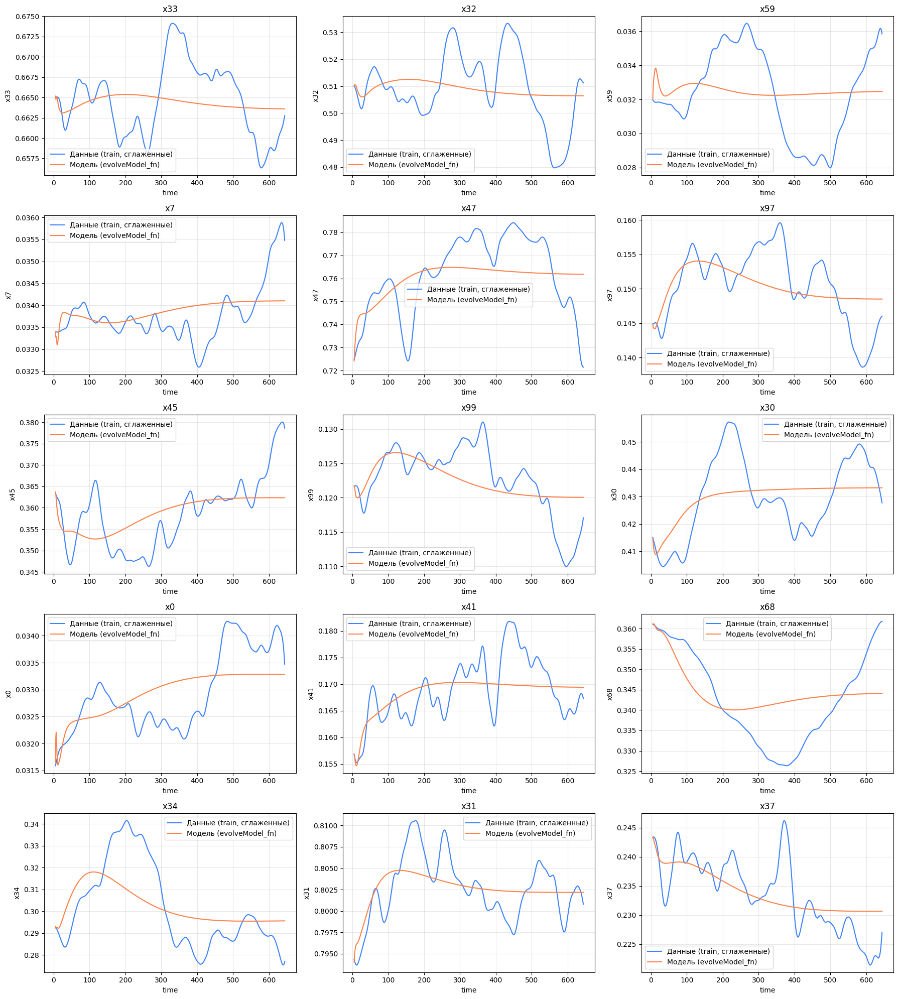

In [8]:
# Модель лучшей итерации (без refit -- см. markdown выше про boundedness) и её
# эволюция внутри обучающего FoM-окна, от того же старта, что использовал сам тулкит:
coeffArray = h['historyCoeffArrayAll'][TRAJ][selection['bestRow']]
variableNames = h['variableNames']
recipes = h['recipes']
fomInds = h['fomTimepointInds']
tTrain = h['tTrain']

initConds = h['simInitCondsAll'][TRAJ].copy()
xTrainObs = h['xTrainAll'][TRAJ][fomInds, :]
xTrainPred = evolveModel_fn(coeffArray, recipes, initConds, tTrain[fomInds])

numVarsToPlot = 15  #!!!!!#  85 признаков не влезет в одну читаемую фигуру
perVarErrTrain = (np.sqrt(np.mean((xTrainPred - xTrainObs) ** 2, axis=0)) /
                  (np.std(xTrainObs, axis=0) + 1e-12))
varsToPlotTrain = np.argsort(-perVarErrTrain)[:numVarsToPlot]  # худшие по посадке

print(f'RMSE эволюции в обучающем окне (медиана по {len(variableNames)} признакам): '
      f'{np.median(np.sqrt(np.mean((xTrainPred - xTrainObs) ** 2, axis=0))):.4f}')

plot_trajectories(
    [xTrainObs[:, varsToPlotTrain], xTrainPred[:, varsToPlotTrain]],
    None,
    tTrain[fomInds],
    coord_names=[variableNames[v] for v in varsToPlotTrain],
    labels=['Данные (train, сглаженные)', 'Модель (evolveModel_fn)'],
)


прогноз: 16 обучающих дней + 81 отложенных дней
RMSE прогноза (медиана по 85 признакам): 0.0138
RMSE персистентности, тот же старт (медиана): 0.0068
(персистентность здесь обычно ниже -- см. оговорку в markdown выше и в plotSelectedIterationsLoyalty.ipynb: точность прогноза не главное, важно что модель остаётся ограниченной)


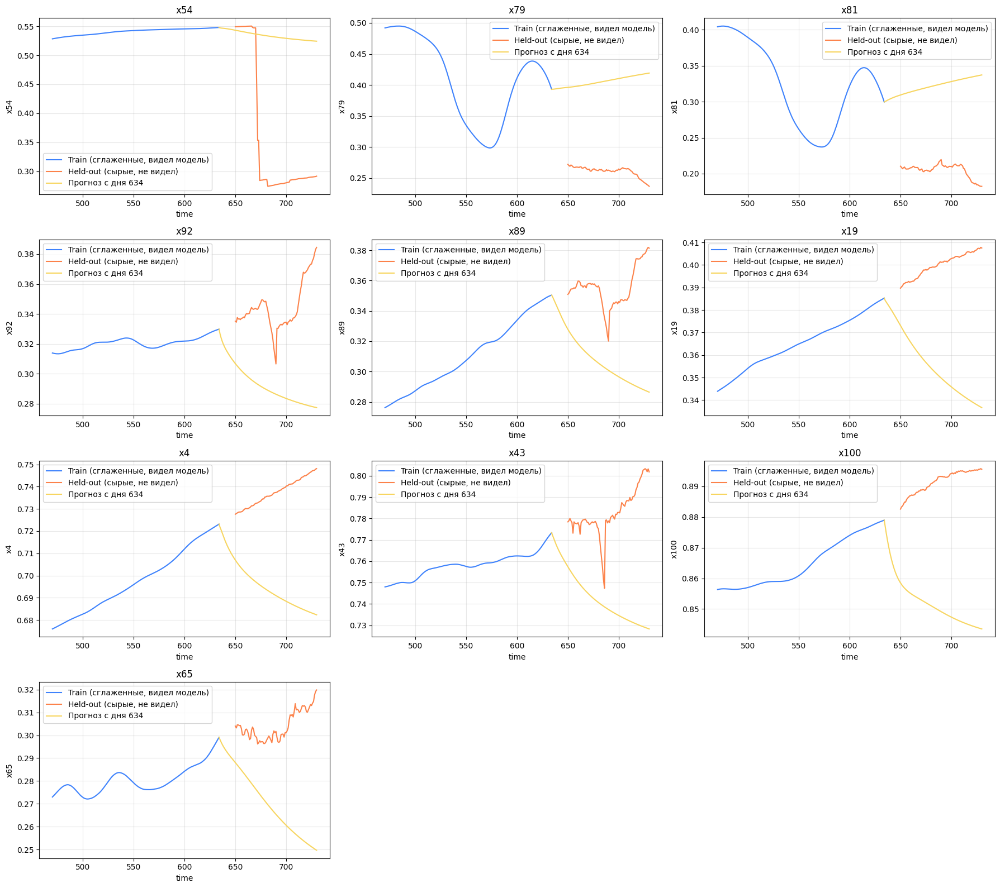

In [6]:
# Прогноз за пределами обучающего диапазона: свободный прогон модели, ничем не управляемый.
# Старт -- за hammingWindowLengthForData // 2 дней до конца обучения, а не на самом краю: этот
# хвост -- артефакт сглаживания (см. markdown выше и plotSelectedIterationsLoyalty.ipynb).
dt = h['dt']
hammingWindowLengthForData = h['hammingWindowLengthForData']
forecastStartInd = len(tTrain) - 1 - hammingWindowLengthForData // 2

xTestObs = h['xTestAll'][TRAJ]
numTestPoints = xTestObs.shape[0]
tTestAbsolute = tTrain[-1] + dt * (1 + np.arange(numTestPoints))
tForecast = np.concatenate([tTrain[forecastStartInd:], tTestAbsolute])

x0Forecast = h['xTrainAll'][TRAJ][forecastStartInd, :]
xForecast = evolveModel_fn(coeffArray, recipes, x0Forecast, tForecast)

numTailPoints = len(tTrain) - forecastStartInd  # обучающие дни, которые прогон проходит первыми
testPart = slice(numTailPoints, numTailPoints + numTestPoints)

rmseForecast = np.sqrt(np.mean((xForecast[testPart, :] - xTestObs) ** 2, axis=0))
persistence = np.tile(x0Forecast, (numTestPoints, 1))
rmsePersistence = np.sqrt(np.mean((persistence - xTestObs) ** 2, axis=0))

print(f'прогноз: {numTailPoints} обучающих дней + {numTestPoints} отложенных дней')
print(f'RMSE прогноза (медиана по {len(variableNames)} признакам): '
      f'{np.median(rmseForecast):.4f}')
print(f'RMSE персистентности, тот же старт (медиана): {np.median(rmsePersistence):.4f}')
print('(персистентность здесь обычно ниже -- см. оговорку в markdown выше и в '
      'plotSelectedIterationsLoyalty.ipynb: точность прогноза не главное, важно что модель '
      'остаётся ограниченной)')

contextDays = max(180, numTailPoints)
tAxis = np.concatenate([tTrain[-contextDays:], tTestAbsolute])

xTrainOnAxis = np.full((len(tAxis), len(variableNames)), np.nan)
xTrainOnAxis[:contextDays - numTailPoints + 1, :] = \
    h['xTrainAll'][TRAJ][-contextDays:forecastStartInd + 1, :]
xTestOnAxis = np.full((len(tAxis), len(variableNames)), np.nan)
xTestOnAxis[contextDays:contextDays + numTestPoints, :] = xTestObs
xForecastOnAxis = np.full((len(tAxis), len(variableNames)), np.nan)
xForecastOnAxis[len(tAxis) - len(tForecast):, :] = xForecast

varsToPlotForecast = np.argsort(-rmseForecast)[:numVarsToPlot]  # худшие по прогнозу

plot_trajectories(
    [xTrainOnAxis[:, varsToPlotForecast], xTestOnAxis[:, varsToPlotForecast],
     xForecastOnAxis[:, varsToPlotForecast]],
    None,
    tAxis,
    coord_names=[variableNames[v] for v in varsToPlotForecast],
    labels=['Train (сглаженные, видел модель)', 'Held-out (сырые, не видел)',
            f'Прогноз с дня {tTrain[forecastStartInd]}'],
)


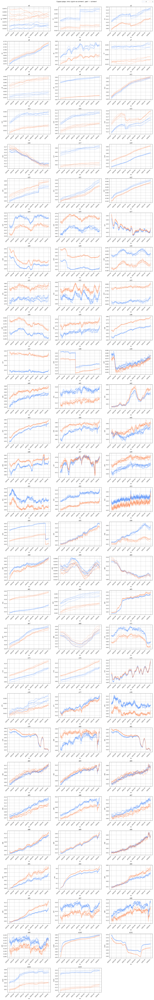

In [7]:
import math
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter

SEGMENT_COLORS = {'old': '#3e82fc', 'new': '#fc824a'}
SEGMENT_LABELS = {
    'old': '0',
    'new': '1',
}
SEGMENT_TRAIN = {'old': train_old, 'new': train_new}

cols_to_plot = feature_cols
n_plots = len(cols_to_plot)
n_cols = 3
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, col in enumerate(cols_to_plot):
    ax = axes[i]
    for label, train in SEGMENT_TRAIN.items():
        for g in range(train.shape[0]):
            ax.plot(dates, train[g, :, i], color=SEGMENT_COLORS[label], lw=0.9, alpha=0.6,
                     label=SEGMENT_LABELS[label] if g == 0 else None)
    ax.set_title(col)
    ax.set_xlabel('dt')
    ax.set_ylabel(col)
    ax.xaxis.set_major_formatter(DateFormatter('%Y-%m'))
    for tick in ax.get_xticklabels():
        tick.set_rotation(45)
        tick.set_ha('right')
    ax.grid(True)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=2)

for j in range(n_plots, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Сырые ряды: пять групп на сегмент, цвет — сегмент', y=1.0)
plt.tight_layout()
plt.show()

{'old': (5, 731, 86), 'new': (5, 731, 86)}


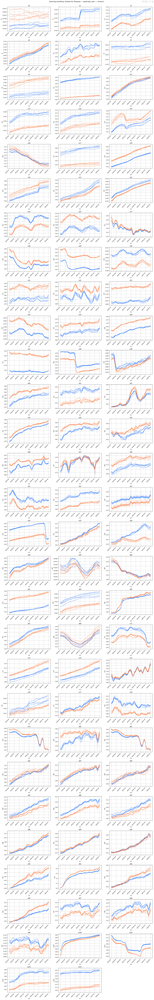

In [9]:
from core.smoothing import hamming_smoothing

# Окно то же, что в loyaltyV4Series.ipynb.
HAMMING_WINDOW = 61

SEGMENT_TRAIN_SMOOTH = {
    label: np.stack([hamming_smoothing(traj, window_size=HAMMING_WINDOW) for traj in train])
    for label, train in SEGMENT_TRAIN.items()
}
print({label: t.shape for label, t in SEGMENT_TRAIN_SMOOTH.items()})

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, col in enumerate(cols_to_plot):
    ax = axes[i]
    for label, train in SEGMENT_TRAIN.items():
        train_smooth = SEGMENT_TRAIN_SMOOTH[label]
        for g in range(train.shape[0]):
            ax.plot(dates, train[g, :, i], color=SEGMENT_COLORS[label], lw=0.6, alpha=0.15)
            ax.plot(dates, train_smooth[g, :, i], color=SEGMENT_COLORS[label], lw=1.4,
                     label=SEGMENT_LABELS[label] if g == 0 else None)
    ax.set_title(col)
    ax.set_xlabel('dt')
    ax.set_ylabel(col)
    ax.xaxis.set_major_formatter(DateFormatter('%Y-%m'))
    for tick in ax.get_xticklabels():
        tick.set_rotation(45)
        tick.set_ha('right')
    ax.grid(True)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=2)

for j in range(n_plots, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle(f'hamming smoothing, window={HAMMING_WINDOW} (бледное — сырой ряд, цвет — сегмент)', y=1.0)
plt.tight_layout()
plt.show()

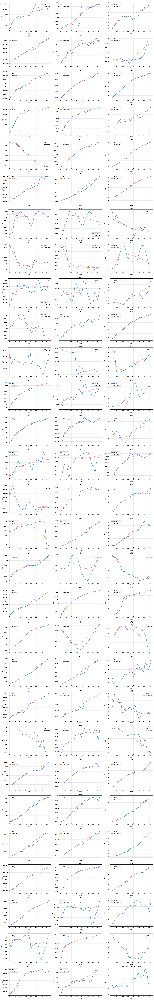

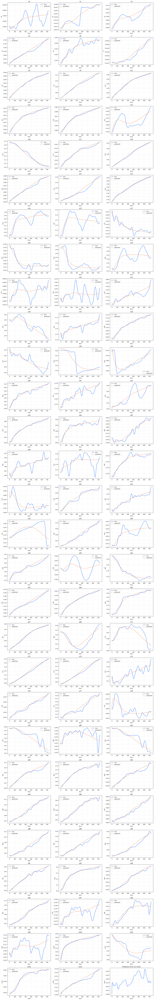

old (0):  R2 произв. -98.0552  R2 траект. 0.9338  RMSE 0.012157  maxRe +9.339e-03
new (1):  R2 произв. -100.8869  R2 траект. 0.9367  RMSE 0.010408  maxRe +3.169e-03
коэффициенты: (2, 86, 87)   # (n_segments=2, n_dims, 1 + n_dims)


In [10]:
from check_traj import fit_polynomial_ode

mean_raw = {label: train.mean(axis=0) for label, train in SEGMENT_TRAIN.items()}
mean_smooth = {
    label: hamming_smoothing(traj, window_size=HAMMING_WINDOW)
    for label, traj in mean_raw.items()
}

n_total = mean_smooth['old'].shape[0]

fits = {}
for label, traj in mean_smooth.items():
    fits[label] = fit_polynomial_ode(
        traj,
        np.arange(n_total),
        1,
        visualize=True,
        report=False,
        extend_time=np.arange(n_total),
        integration_subdivisions=20,
        coord_names=cols_to_plot,
        bounded=True,
        boundedness_method='trapping',
    )

for label in ('old', 'new'):
    r = fits[label]
    print(f"{label:>3} ({SEGMENT_LABELS[label]}):"
          f"  R2 произв. {np.median(r['r2_derivative']):.4f}"
          f"  R2 траект. {np.median(r['r2_trajectory']):.4f}"
          f"  RMSE {r['rmse_total']:.6f}"
          f"  maxRe {r['boundedness_violation_unconstrained']:+.3e}")

coeff = np.stack([np.asarray(fits['old']['coefficients']), np.asarray(fits['new']['coefficients'])])
A = coeff[:, :, 1:]
print(f"коэффициенты: {coeff.shape}   # (n_segments=2, n_dims, 1 + n_dims)")